# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [4]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [5]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [10]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [11]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [12]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [13]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5
    
    assert str(block.__getitem__(0)).replace(' ', '') == f'Linear(in_features={in_features},out_features={out_features},bias=True)'        
    assert str(block.__getitem__(1)).replace(' ', '').replace(',inplace=True', '') == 'LeakyReLU(negative_slope=0.2)'


test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [14]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [15]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [16]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [17]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [24]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####    
    fake_noise = get_noise(num_images, z_dim, device=device)
    gen_fake_img = gen(fake_noise)
    
    disc_fake_pred = disc(gen_fake_img.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    
    disc_real_pred = disc(real.detach())
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [25]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None

    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [28]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    gen_fake_img = gen(fake_noise)
    
    disc_fake_pred = disc(gen_fake_img)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [29]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](MNIST_Progression.png)

Step 500: Generator loss: 1.4024995305538162, discriminator loss: 0.4196286123394962


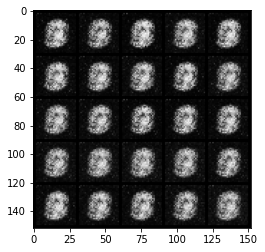

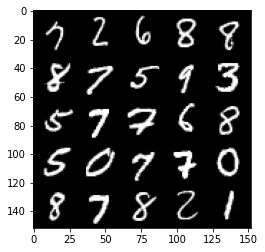

Step 1000: Generator loss: 1.7720090060234055, discriminator loss: 0.27010702902078637


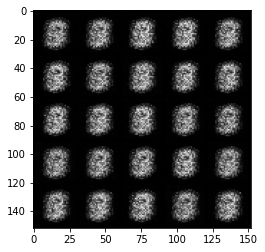

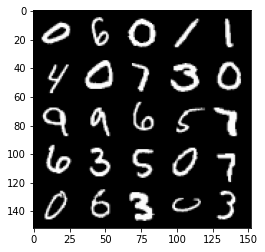

Step 1500: Generator loss: 2.0482922723293293, discriminator loss: 0.16075018654763687


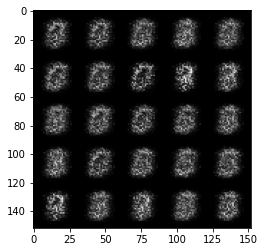

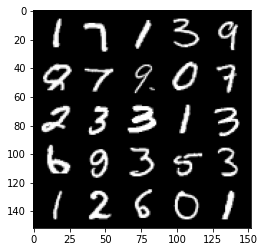

Step 2000: Generator loss: 1.7662620754241924, discriminator loss: 0.20258244454860677


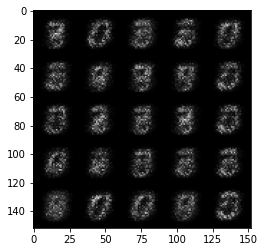

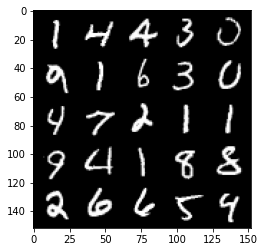

Step 2500: Generator loss: 1.731811821222304, discriminator loss: 0.20387130975723267


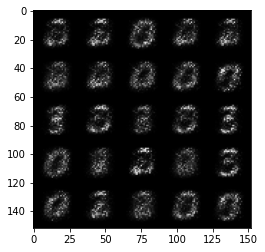

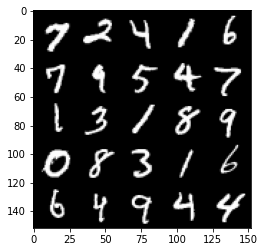

Step 3000: Generator loss: 1.976158841609955, discriminator loss: 0.16639488655328746


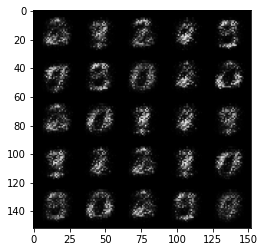

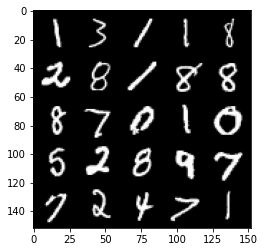

Step 3500: Generator loss: 2.4429465780258193, discriminator loss: 0.12148532791435707


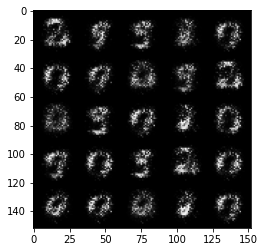

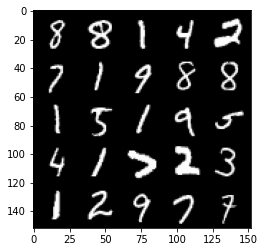

Step 4000: Generator loss: 2.7901627073287933, discriminator loss: 0.10465009018778791


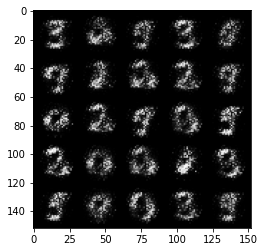

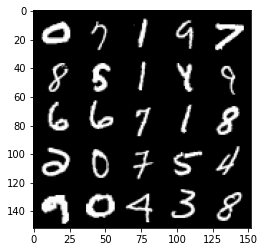

Step 4500: Generator loss: 3.2385004029273987, discriminator loss: 0.07945760587602856


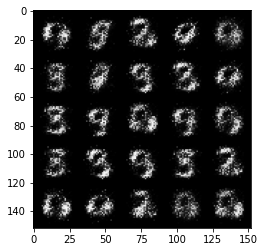

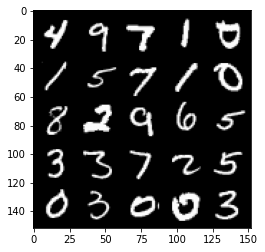

Step 5000: Generator loss: 3.4745673313140872, discriminator loss: 0.06383520685136315


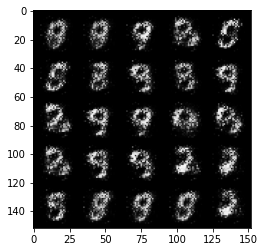

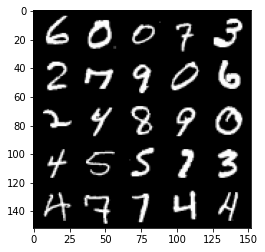

Step 5500: Generator loss: 3.9791048417091384, discriminator loss: 0.05300774141773576


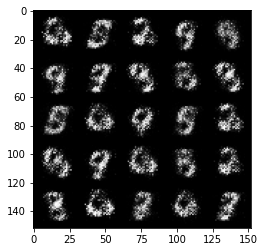

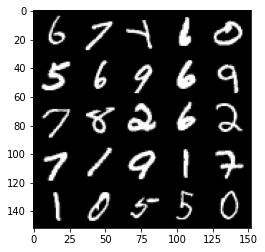

Step 6000: Generator loss: 3.9599602413177473, discriminator loss: 0.0626451166048646


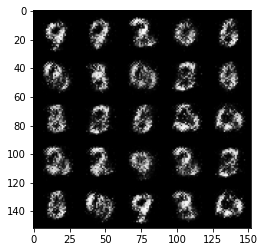

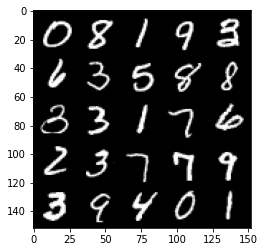

Step 6500: Generator loss: 3.997071178913117, discriminator loss: 0.05929122135043145


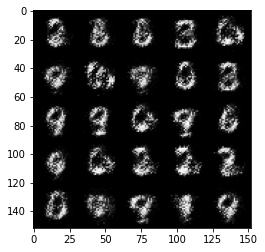

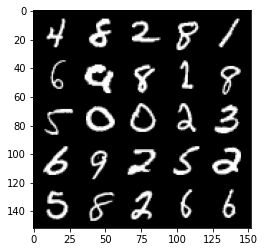

Step 7000: Generator loss: 4.0439872975349385, discriminator loss: 0.05157427785173065


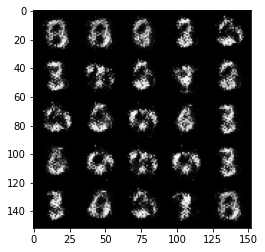

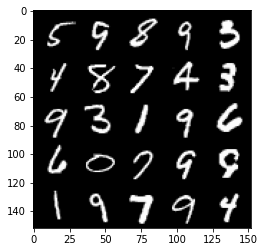

Step 7500: Generator loss: 4.370749195575715, discriminator loss: 0.049398458924144524


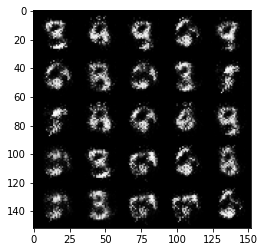

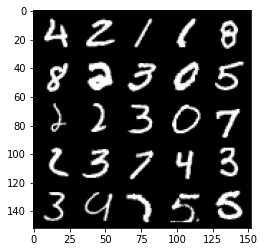

Step 8000: Generator loss: 4.222874361038203, discriminator loss: 0.05519146667048332


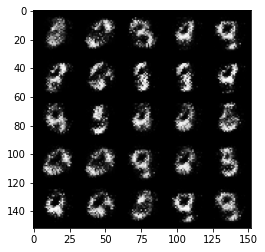

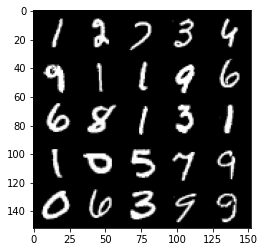

Step 8500: Generator loss: 4.132650433063507, discriminator loss: 0.05343578626215457


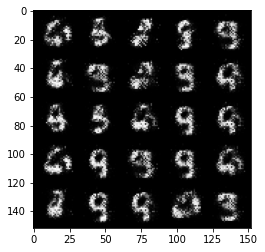

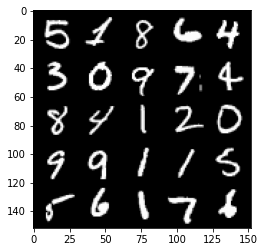

Step 9000: Generator loss: 4.240624472141268, discriminator loss: 0.04801769141852854


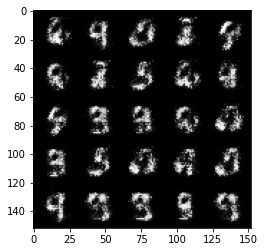

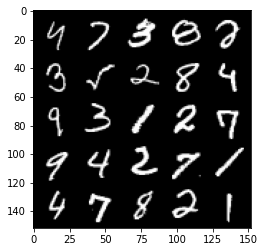

Step 9500: Generator loss: 4.038270780086516, discriminator loss: 0.06076674745231861


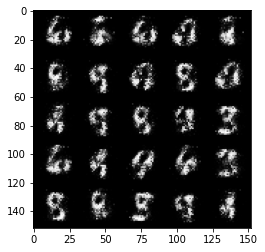

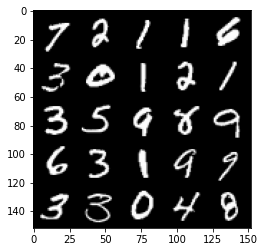

Step 10000: Generator loss: 4.090770289421081, discriminator loss: 0.06305311509966846


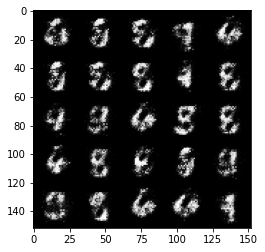

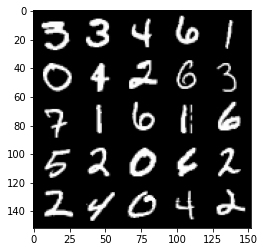

Step 10500: Generator loss: 4.167130939006807, discriminator loss: 0.05837137494236233


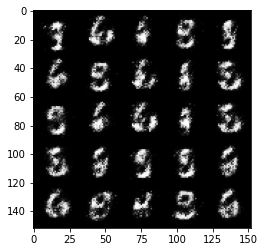

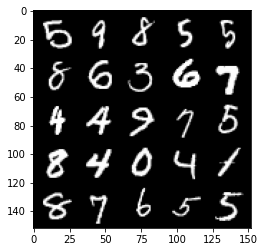

Step 11000: Generator loss: 4.167134152412416, discriminator loss: 0.06472346972674128


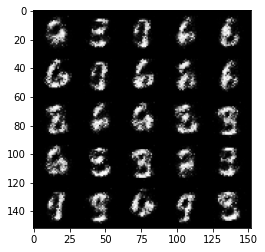

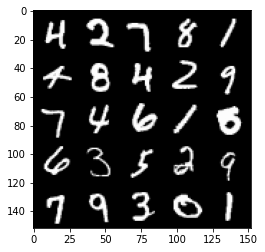

Step 11500: Generator loss: 3.9108954458236687, discriminator loss: 0.0666781200692058


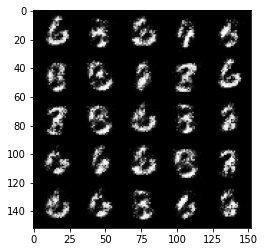

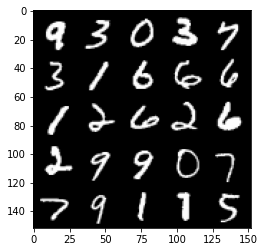

Step 12000: Generator loss: 3.9969507765769956, discriminator loss: 0.0694008768945933


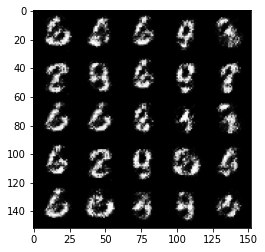

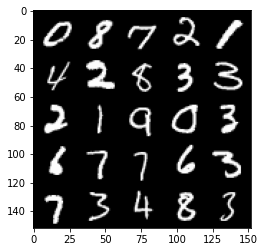

Step 12500: Generator loss: 4.012915004730222, discriminator loss: 0.07658522962778815


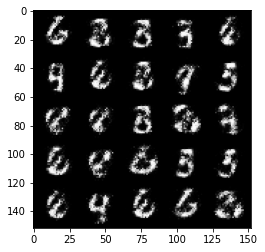

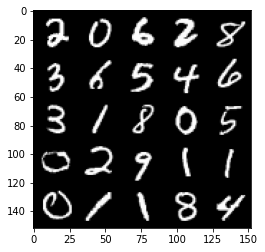

Step 13000: Generator loss: 3.995226502418516, discriminator loss: 0.08034622136503457


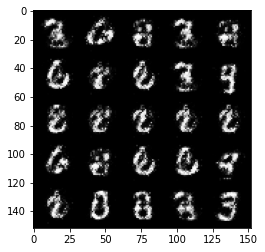

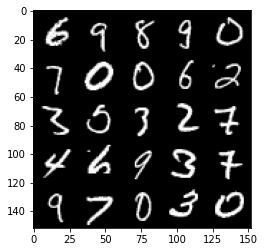

Step 13500: Generator loss: 3.8836886038780176, discriminator loss: 0.08504895494878295


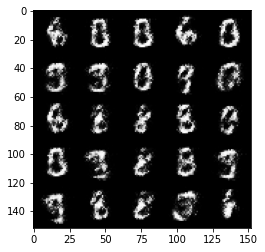

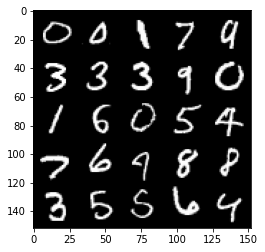

Step 14000: Generator loss: 3.98320853662491, discriminator loss: 0.08561252767592668


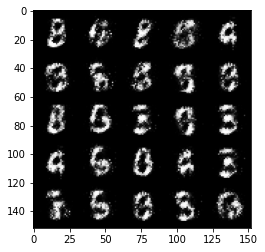

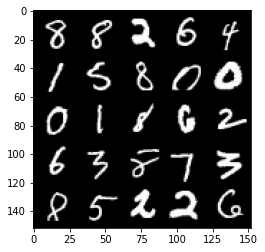

Step 14500: Generator loss: 4.083106789112091, discriminator loss: 0.0762105244025588


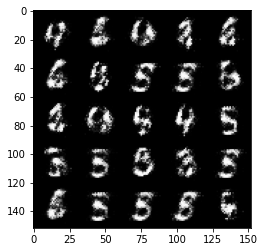

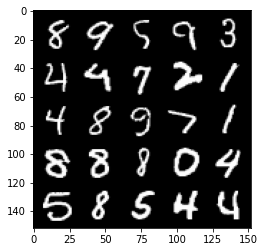

Step 15000: Generator loss: 4.083027861118318, discriminator loss: 0.0714641330726445


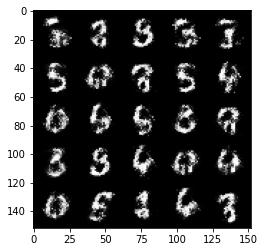

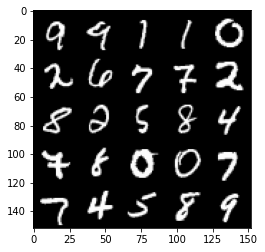

Step 15500: Generator loss: 4.294772072792055, discriminator loss: 0.07543341991305351


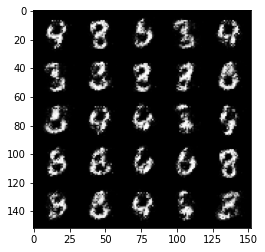

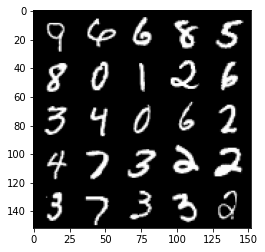

Step 16000: Generator loss: 4.0006857967376686, discriminator loss: 0.09561919335275895


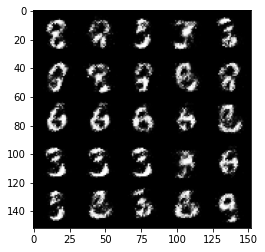

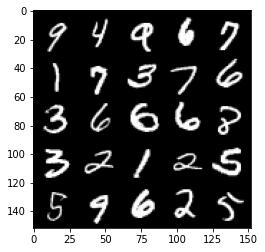

Step 16500: Generator loss: 3.987126497745514, discriminator loss: 0.09832180080562826


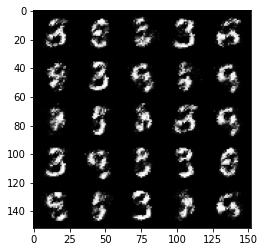

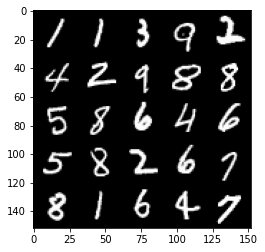

Step 17000: Generator loss: 3.8393744306564344, discriminator loss: 0.10583544952422376


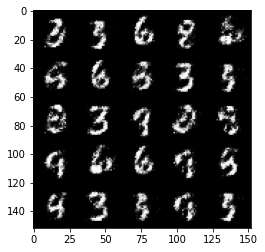

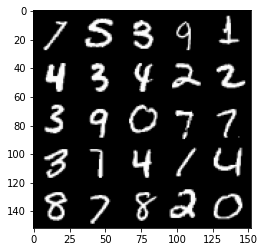

Step 17500: Generator loss: 3.638679540157315, discriminator loss: 0.10836691328138107


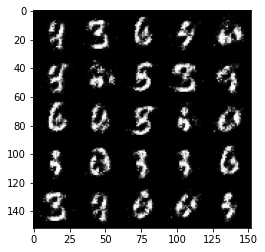

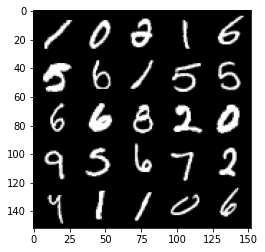

Step 18000: Generator loss: 3.6965780682563794, discriminator loss: 0.09256002172082665


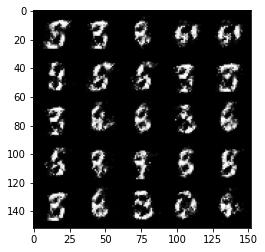

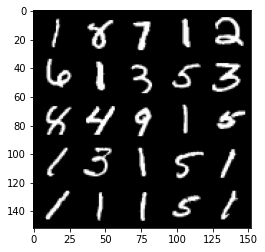

Step 18500: Generator loss: 3.8471124982833858, discriminator loss: 0.10316212662309412


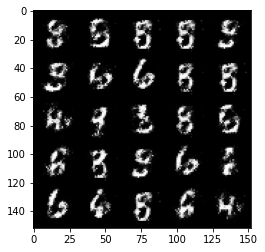

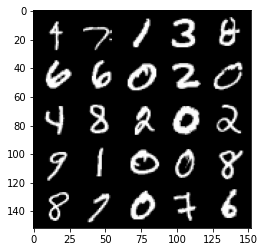

Step 19000: Generator loss: 3.713715502262115, discriminator loss: 0.1233494925424456


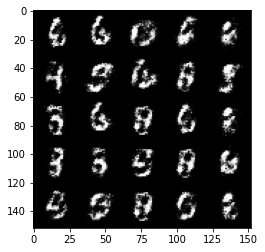

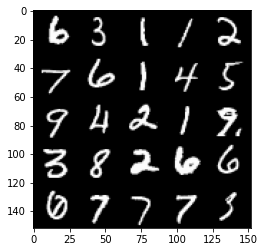

Step 19500: Generator loss: 3.577379642009733, discriminator loss: 0.1245695751830935


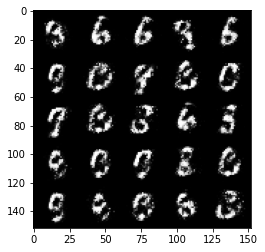

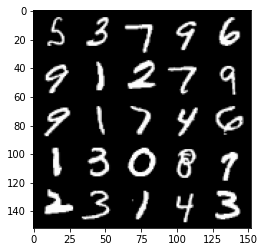

Step 20000: Generator loss: 3.6966852111816393, discriminator loss: 0.11527115693688386


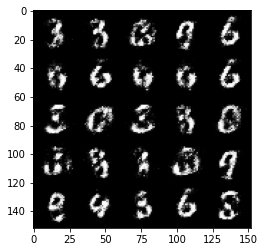

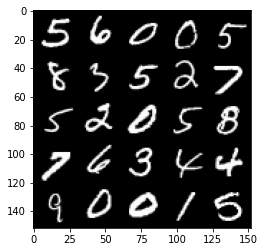

Step 20500: Generator loss: 3.637671024322512, discriminator loss: 0.12232668136805294


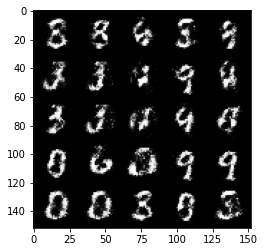

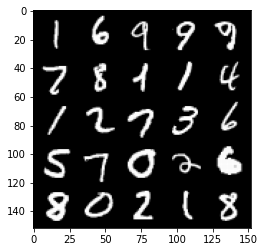

Step 21000: Generator loss: 3.5643370065689113, discriminator loss: 0.1286684147268534


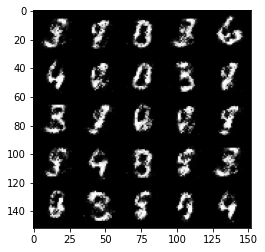

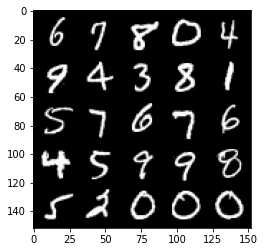

Step 21500: Generator loss: 3.48059551000595, discriminator loss: 0.1417079666182401


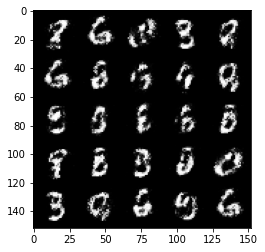

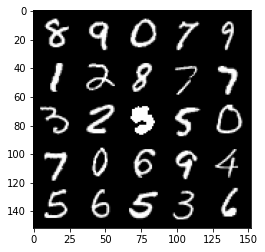

Step 22000: Generator loss: 3.4016969785690305, discriminator loss: 0.15184159755706794


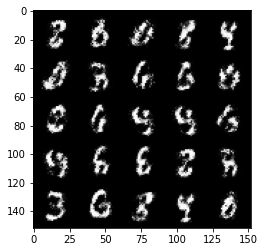

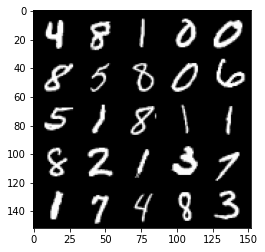

Step 22500: Generator loss: 3.3798280291557323, discriminator loss: 0.14865204696357243


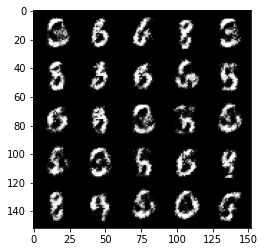

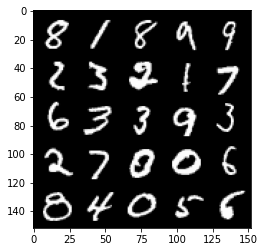

Step 23000: Generator loss: 3.282942015647888, discriminator loss: 0.17485058139264592


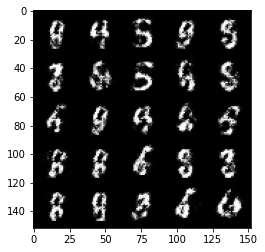

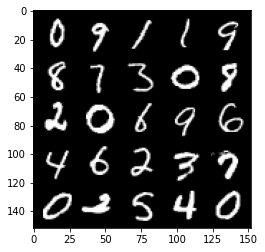

Step 23500: Generator loss: 3.205450168132782, discriminator loss: 0.17497172574698924


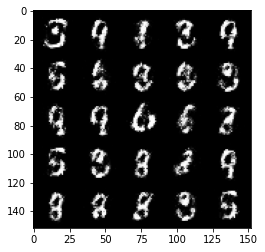

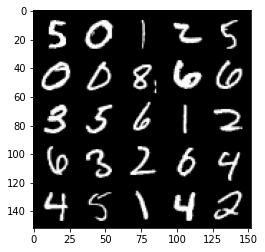

Step 24000: Generator loss: 3.1089515342712377, discriminator loss: 0.19842187240719794


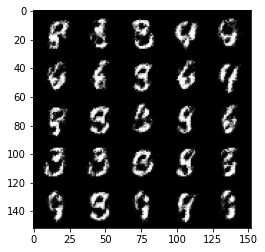

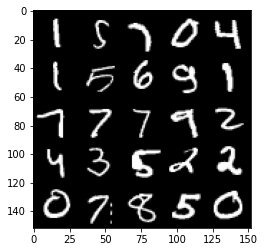

Step 24500: Generator loss: 3.035799176692964, discriminator loss: 0.18922008040547375


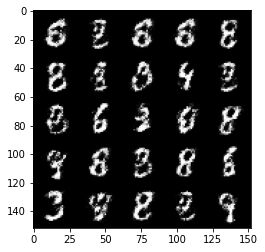

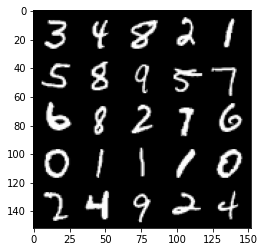

Step 25000: Generator loss: 3.0164049282073964, discriminator loss: 0.18812764039635638


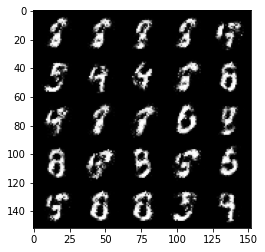

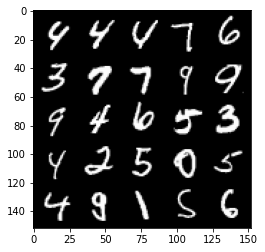

Step 25500: Generator loss: 3.0927718596458433, discriminator loss: 0.1748522442281247


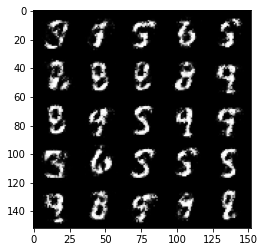

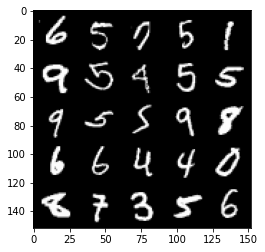

Step 26000: Generator loss: 2.9729450716972354, discriminator loss: 0.19863362929224973


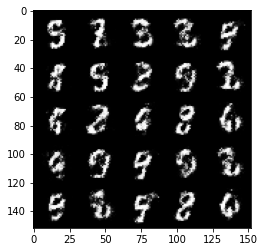

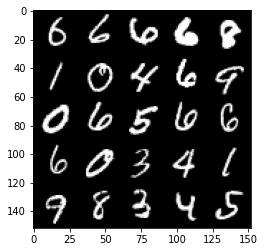

Step 26500: Generator loss: 2.971023585796358, discriminator loss: 0.20081358212232592


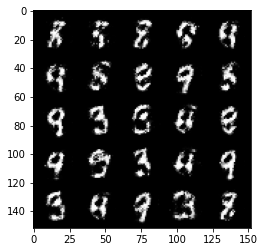

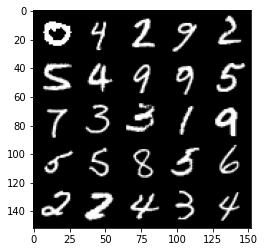

Step 27000: Generator loss: 3.052109993457796, discriminator loss: 0.18760537776350975


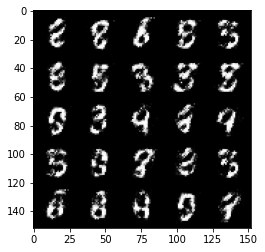

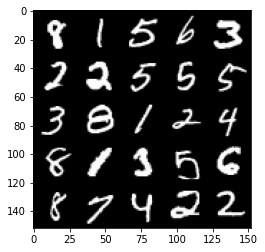

Step 27500: Generator loss: 3.1548553886413573, discriminator loss: 0.1647651994824409


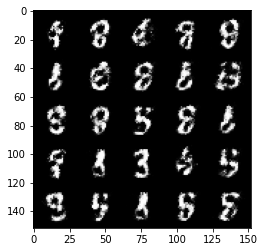

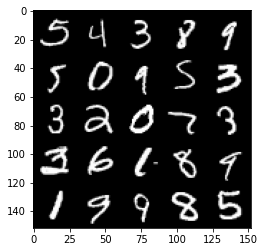

Step 28000: Generator loss: 3.1328695430755613, discriminator loss: 0.18189980521798116


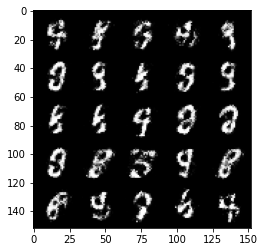

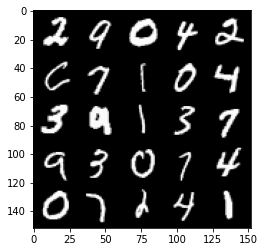

Step 28500: Generator loss: 2.8862768120765696, discriminator loss: 0.20004351103305826


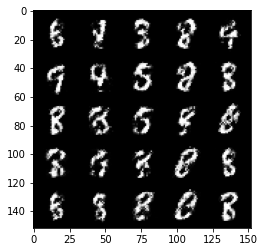

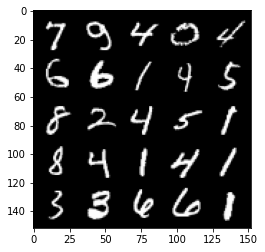

Step 29000: Generator loss: 3.0684183177948006, discriminator loss: 0.1816542712301016


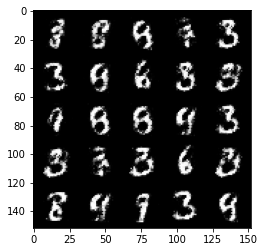

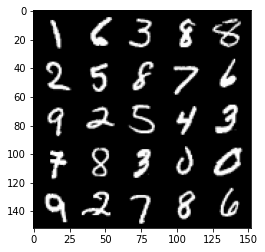

Step 29500: Generator loss: 2.9606874389648463, discriminator loss: 0.1917542098760608


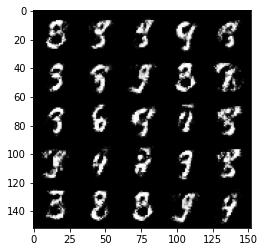

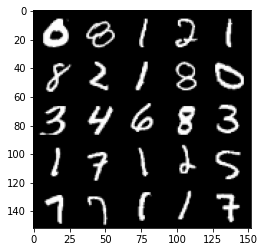

Step 30000: Generator loss: 3.0473961286544826, discriminator loss: 0.18358939135074612


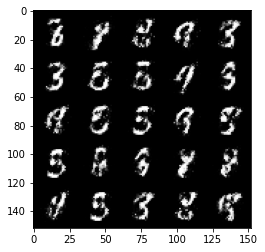

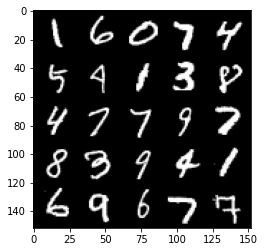

Step 30500: Generator loss: 3.1503019347190837, discriminator loss: 0.17403637854754936


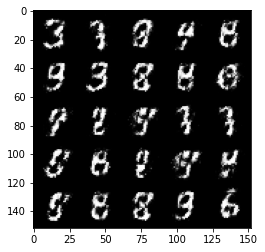

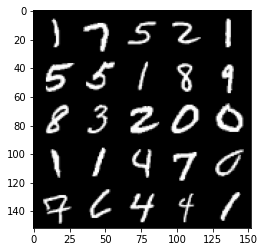

Step 31000: Generator loss: 2.9297743568420445, discriminator loss: 0.18375417321920381


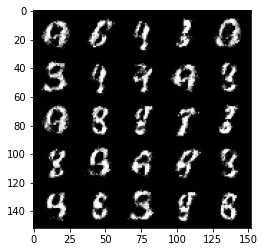

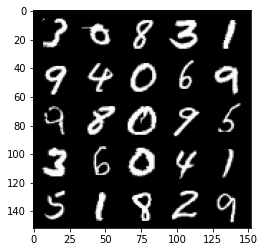

Step 31500: Generator loss: 2.8591518168449404, discriminator loss: 0.2093486857712269


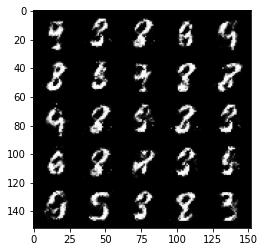

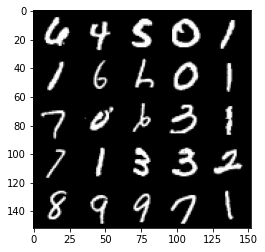

Step 32000: Generator loss: 2.9742798805236803, discriminator loss: 0.1950984165370464


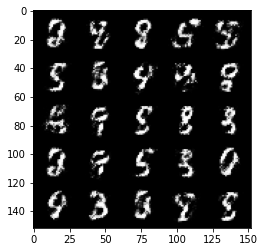

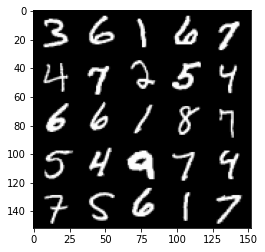

Step 32500: Generator loss: 2.8788278045654296, discriminator loss: 0.19954713918268702


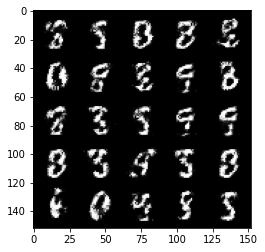

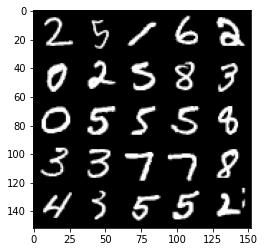

Step 33000: Generator loss: 2.778248471260071, discriminator loss: 0.20795348083972928


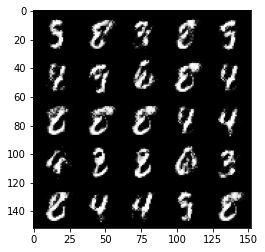

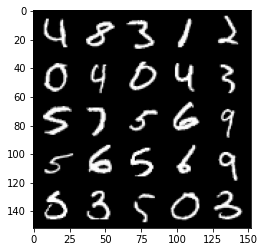

Step 33500: Generator loss: 2.736667937278745, discriminator loss: 0.22419593724608408


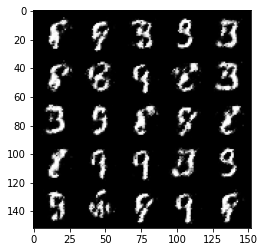

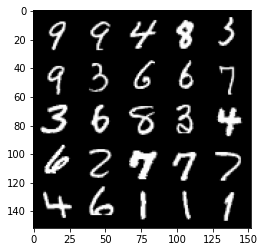

Step 34000: Generator loss: 2.751439771175383, discriminator loss: 0.22430206561088578


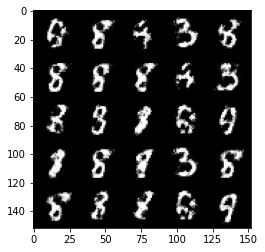

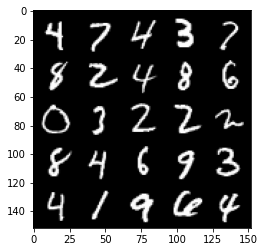

Step 34500: Generator loss: 2.768416412353516, discriminator loss: 0.20813404664397256


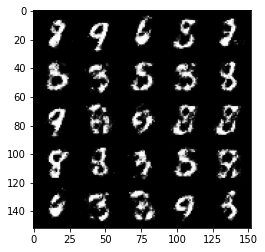

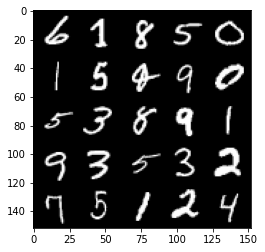

Step 35000: Generator loss: 2.690165514469144, discriminator loss: 0.221041492640972


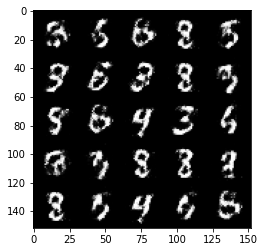

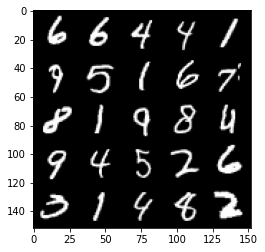

Step 35500: Generator loss: 2.739501069068908, discriminator loss: 0.21888469323515894


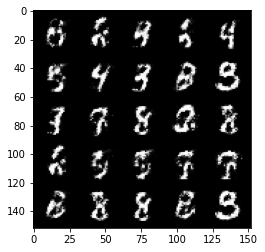

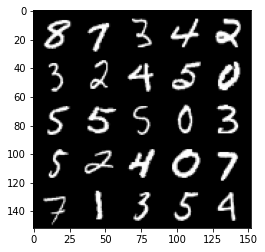

Step 36000: Generator loss: 2.649353179931643, discriminator loss: 0.22514529573917363


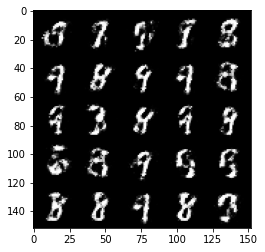

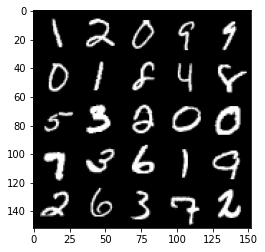

Step 36500: Generator loss: 2.514903284311296, discriminator loss: 0.24046912604570406


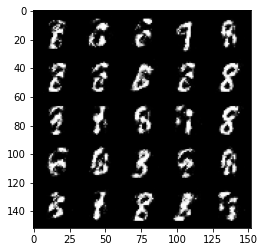

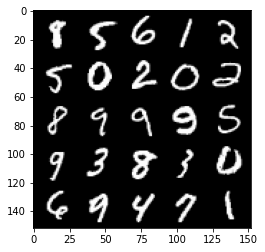

Step 37000: Generator loss: 2.652095640659331, discriminator loss: 0.2341445220410823


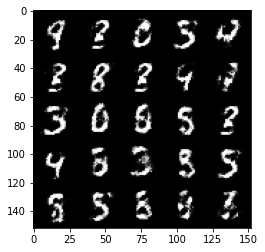

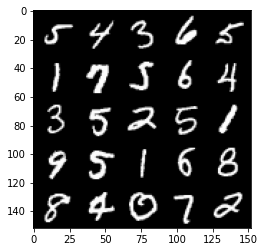

Step 37500: Generator loss: 2.5186171817779552, discriminator loss: 0.23261507454514507


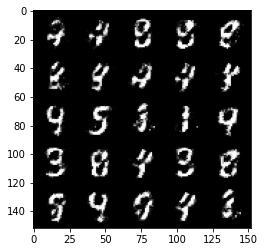

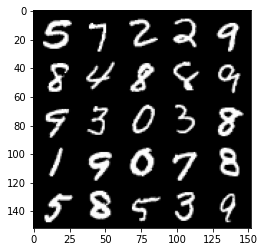

Step 38000: Generator loss: 2.5494032492637624, discriminator loss: 0.23169170424342164


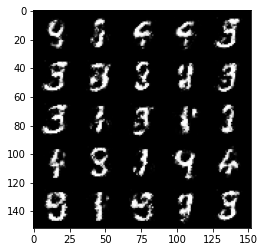

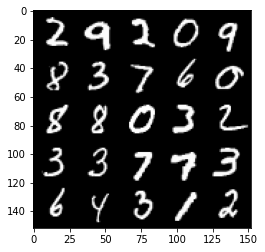

Step 38500: Generator loss: 2.5146659622192398, discriminator loss: 0.24275542917847628


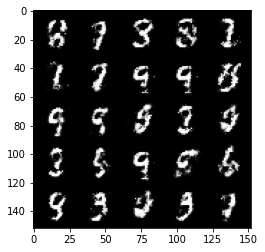

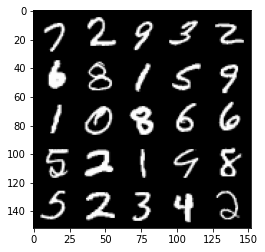

Step 39000: Generator loss: 2.469454893589021, discriminator loss: 0.25270679488778086


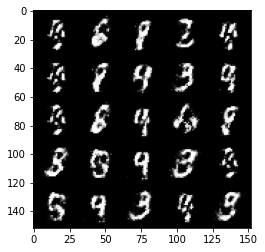

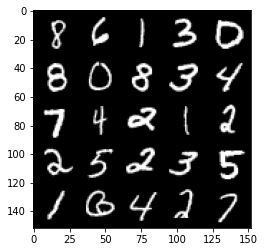

Step 39500: Generator loss: 2.557261751174929, discriminator loss: 0.23068635854125014


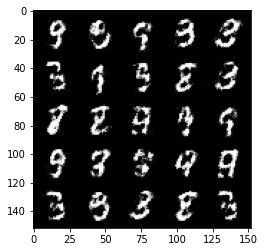

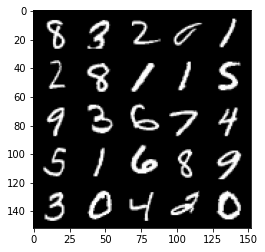

Step 40000: Generator loss: 2.4720168488025664, discriminator loss: 0.2604312358200551


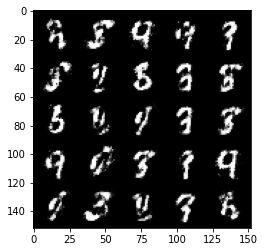

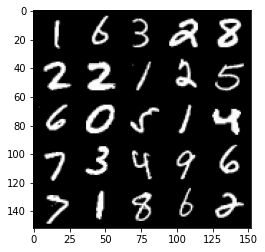

Step 40500: Generator loss: 2.3863902077674894, discriminator loss: 0.2657654217779637


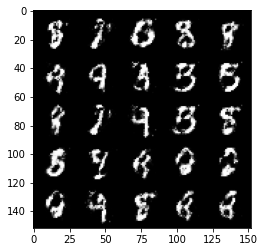

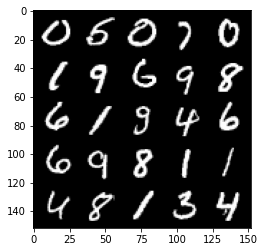

Step 41000: Generator loss: 2.278201908588409, discriminator loss: 0.28340686729550346


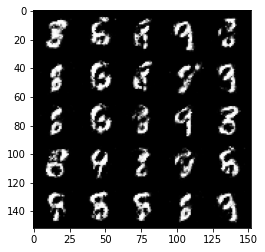

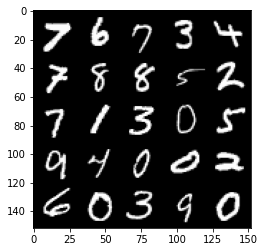

Step 41500: Generator loss: 2.1817909030914318, discriminator loss: 0.2949261547327042


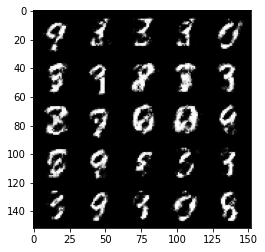

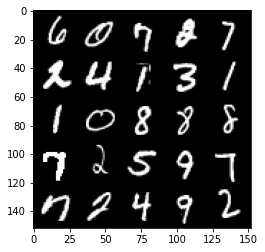

Step 42000: Generator loss: 2.277688548564911, discriminator loss: 0.27249785357713713


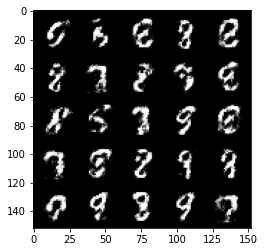

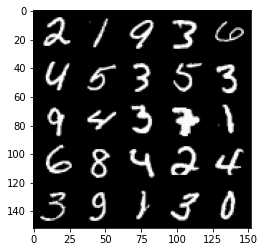

Step 42500: Generator loss: 2.2467157483100895, discriminator loss: 0.28640229287743574


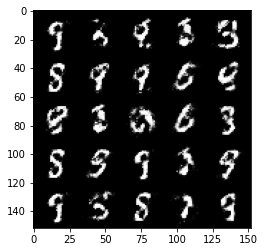

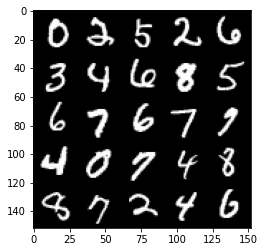

Step 43000: Generator loss: 2.290425026655199, discriminator loss: 0.2657241390049458


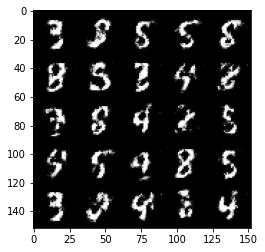

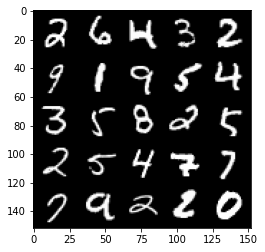

Step 43500: Generator loss: 2.276298327684402, discriminator loss: 0.27002338039875023


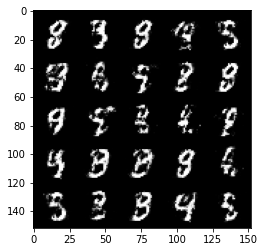

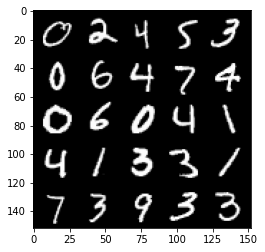

Step 44000: Generator loss: 2.2675960180759445, discriminator loss: 0.27101722401380546


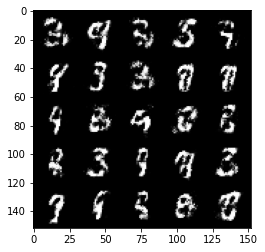

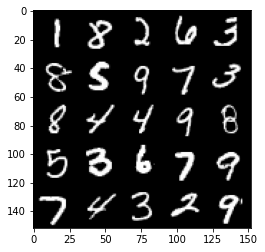

Step 44500: Generator loss: 2.315495692729947, discriminator loss: 0.26310820648074174


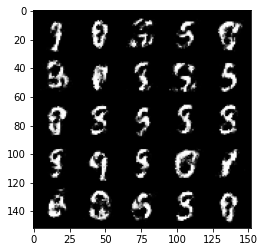

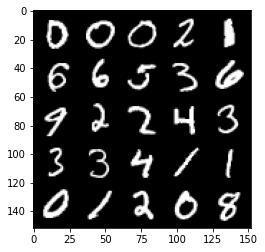

Step 45000: Generator loss: 2.325732674598691, discriminator loss: 0.2679057694375514


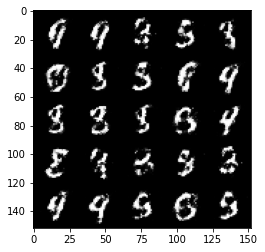

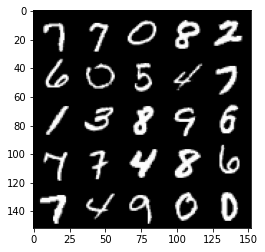

Step 45500: Generator loss: 2.3647470202445997, discriminator loss: 0.2681284291148187


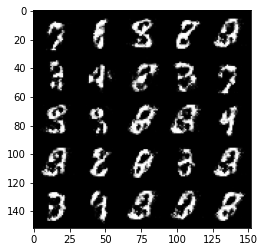

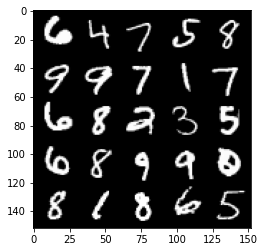

Step 46000: Generator loss: 2.235375436782836, discriminator loss: 0.3025918605029582


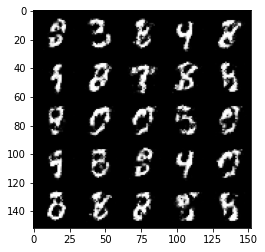

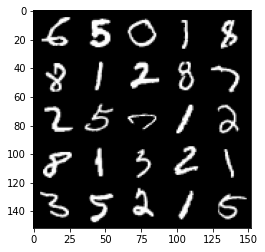

Step 46500: Generator loss: 2.2775115694999717, discriminator loss: 0.29046322250366224


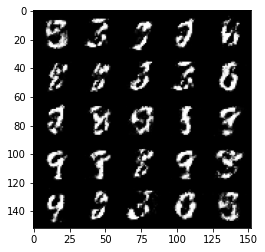

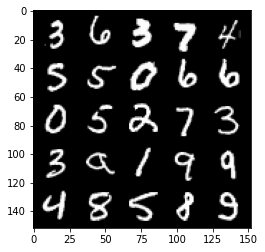

Step 47000: Generator loss: 2.280473430395126, discriminator loss: 0.27635965669155094


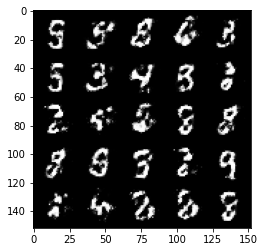

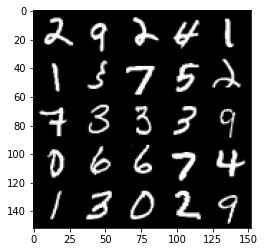

Step 47500: Generator loss: 2.1489168069362625, discriminator loss: 0.3141853448152543


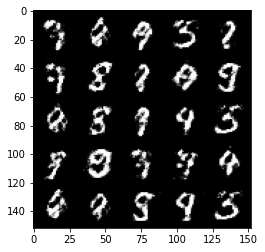

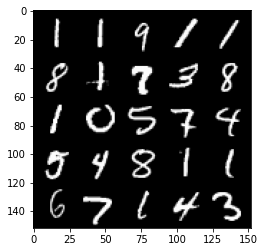

Step 48000: Generator loss: 2.153935618162155, discriminator loss: 0.2986204898953438


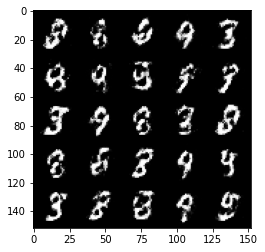

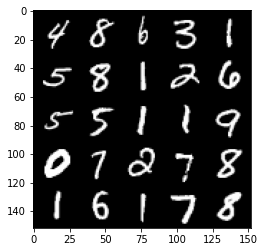

Step 48500: Generator loss: 2.0995780255794516, discriminator loss: 0.313389592170715


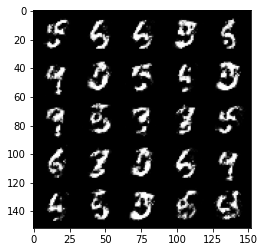

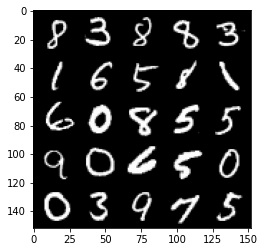

Step 49000: Generator loss: 2.106735439300537, discriminator loss: 0.3150348134636877


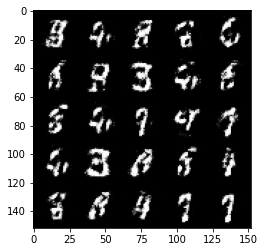

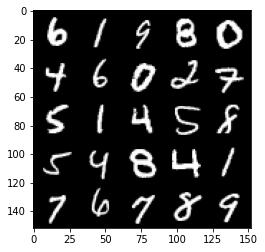

Step 49500: Generator loss: 2.1005110452175155, discriminator loss: 0.3119884098470212


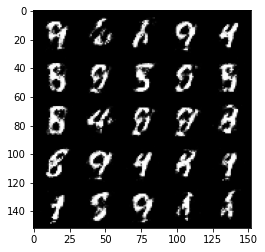

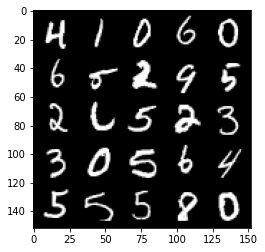

Step 50000: Generator loss: 2.122269867420198, discriminator loss: 0.3008307658731936


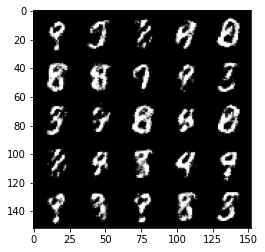

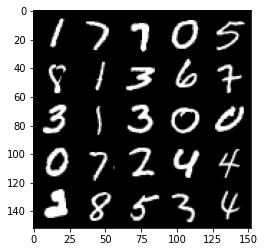

Step 50500: Generator loss: 2.0404065937995894, discriminator loss: 0.31759716230630886


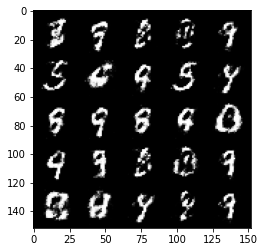

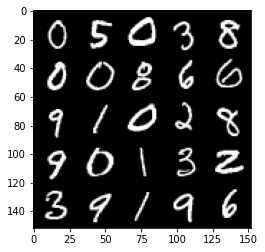

Step 51000: Generator loss: 1.978182391643524, discriminator loss: 0.3333492148816586


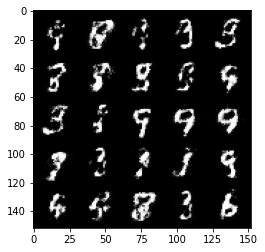

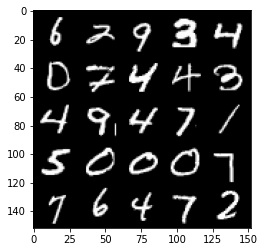

Step 51500: Generator loss: 1.9789853937625879, discriminator loss: 0.3335227676928045


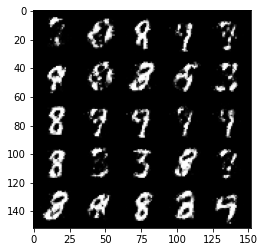

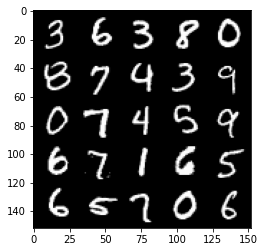

Step 52000: Generator loss: 1.9212263739109026, discriminator loss: 0.3462593294084073


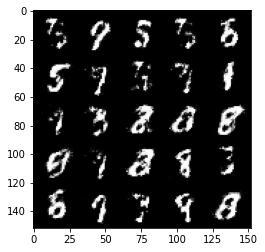

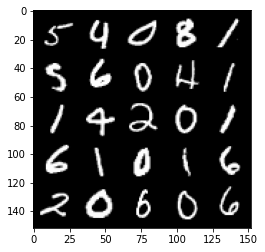

Step 52500: Generator loss: 1.9305481762886056, discriminator loss: 0.3427640271782876


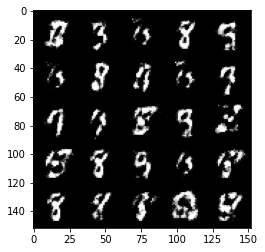

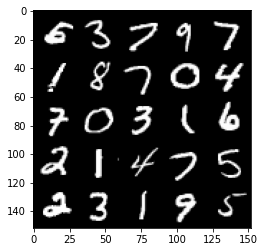

Step 53000: Generator loss: 1.9900119614601122, discriminator loss: 0.3254873806536196


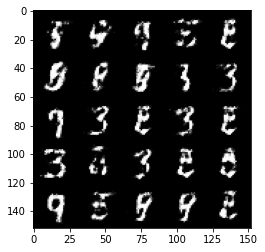

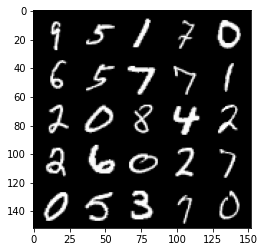

Step 53500: Generator loss: 1.885203734159469, discriminator loss: 0.3637623978257175


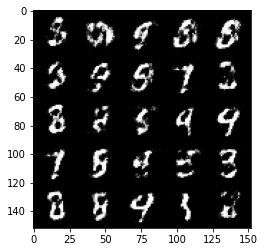

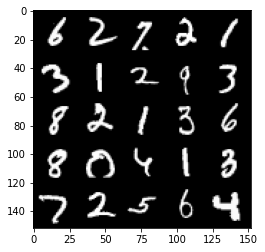

Step 54000: Generator loss: 1.8387372226715075, discriminator loss: 0.3734439733624457


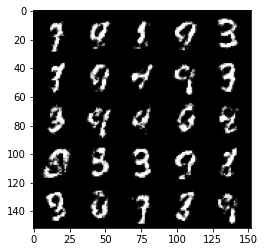

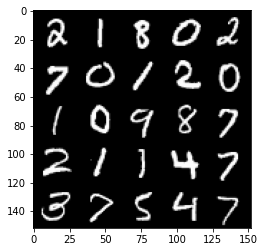

Step 54500: Generator loss: 1.8220847461223595, discriminator loss: 0.3840765904188155


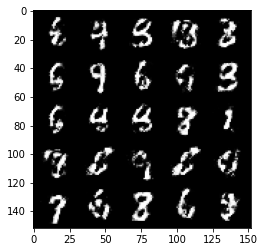

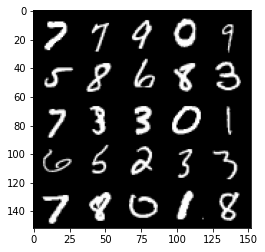

Step 55000: Generator loss: 1.8107339835166931, discriminator loss: 0.3668087882399559


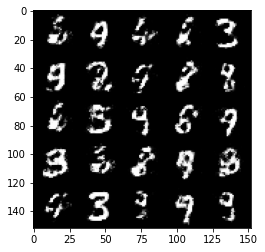

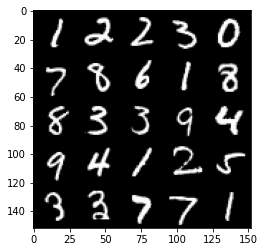

Step 55500: Generator loss: 1.8467326157093027, discriminator loss: 0.36075760358571995


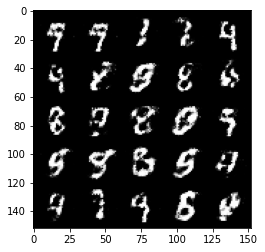

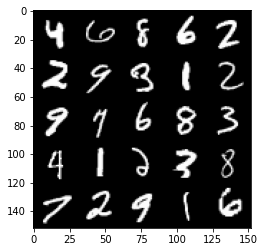

Step 56000: Generator loss: 1.7989641025066374, discriminator loss: 0.35946143567562105


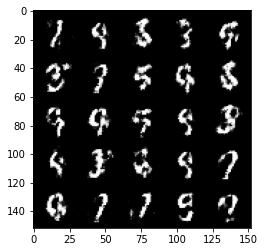

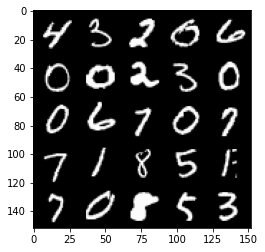

Step 56500: Generator loss: 1.811857272624969, discriminator loss: 0.3593172725141047


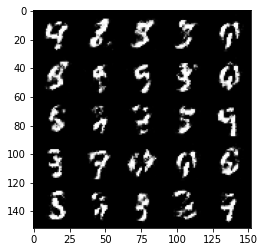

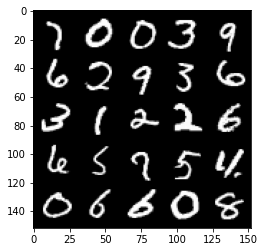

Step 57000: Generator loss: 1.8102797737121576, discriminator loss: 0.3528846857845785


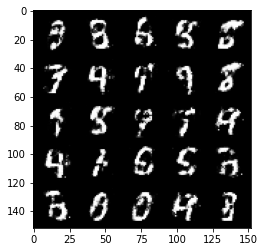

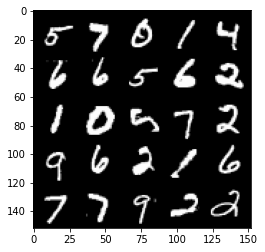

Step 57500: Generator loss: 1.8413073987960824, discriminator loss: 0.35232267111539856


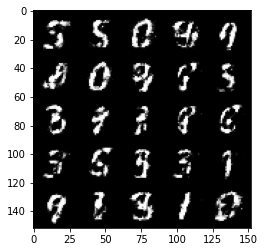

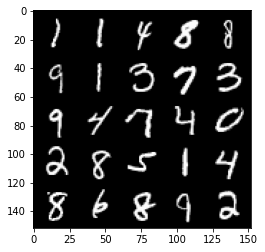

Step 58000: Generator loss: 1.7847571737766268, discriminator loss: 0.3685991705060004


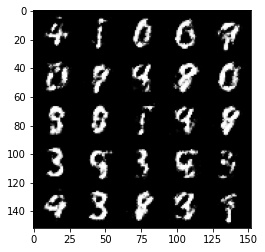

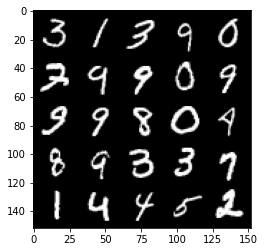

Step 58500: Generator loss: 1.70381374669075, discriminator loss: 0.3728117194175716


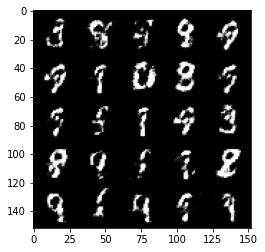

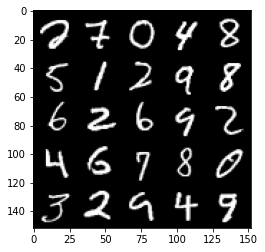

Step 59000: Generator loss: 1.8054953894615173, discriminator loss: 0.3581545303165913


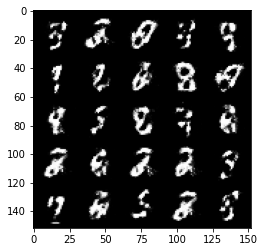

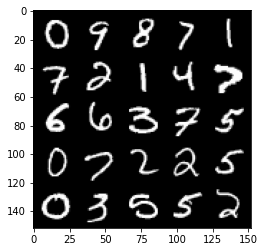

Step 59500: Generator loss: 1.7302850210666647, discriminator loss: 0.3675744343400001


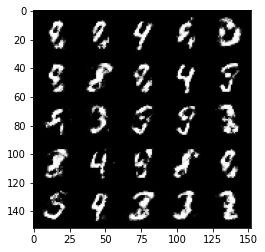

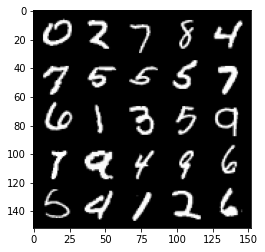

Step 60000: Generator loss: 1.884200902700423, discriminator loss: 0.34507368391752236


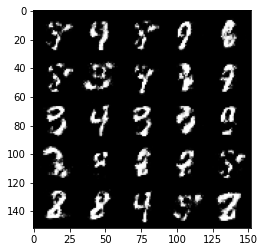

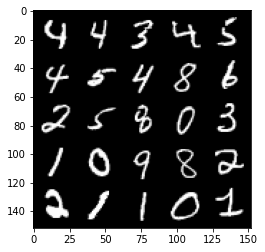

Step 60500: Generator loss: 1.748541734933854, discriminator loss: 0.36714728999137863


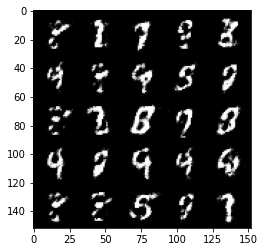

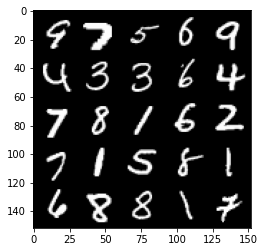

Step 61000: Generator loss: 1.6920675890445713, discriminator loss: 0.3796941216588016


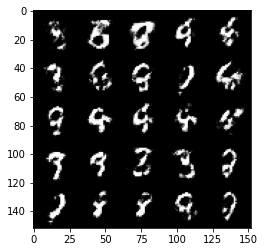

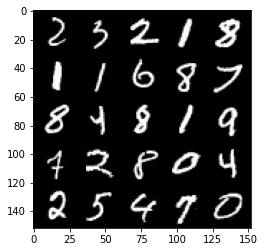

Step 61500: Generator loss: 1.746105594873429, discriminator loss: 0.3637251033186914


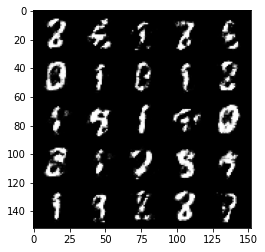

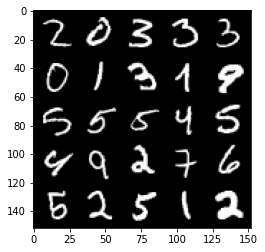

Step 62000: Generator loss: 1.7301070344448075, discriminator loss: 0.3683301263749598


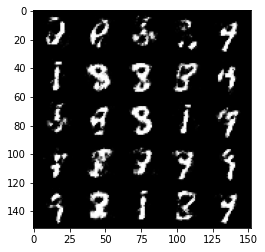

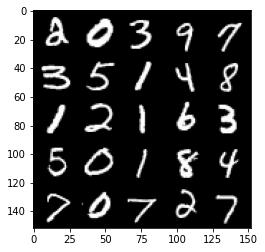

Step 62500: Generator loss: 1.7088969366550455, discriminator loss: 0.3722235690355301


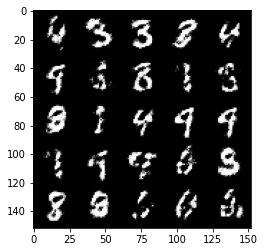

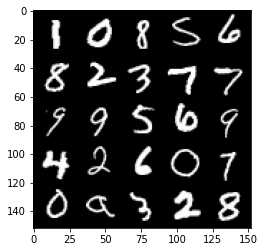

Step 63000: Generator loss: 1.7175078146457659, discriminator loss: 0.3764361611604698


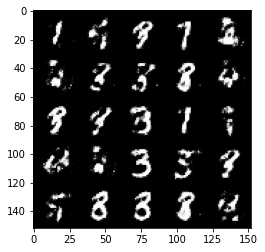

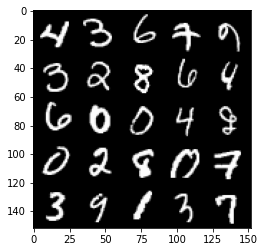

Step 63500: Generator loss: 1.658037556886673, discriminator loss: 0.39510895377397565


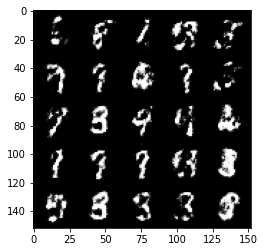

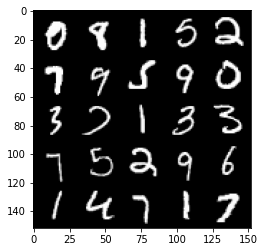

Step 64000: Generator loss: 1.6011769139766698, discriminator loss: 0.4030676330924032


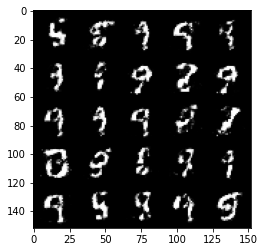

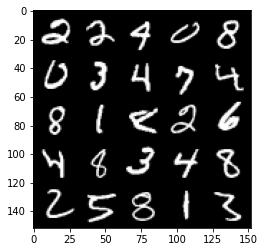

Step 64500: Generator loss: 1.6693344061374662, discriminator loss: 0.393997395157814


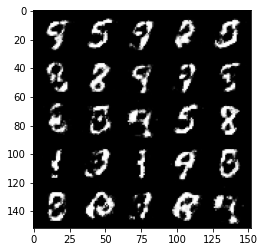

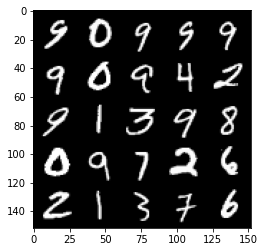

Step 65000: Generator loss: 1.608964514493943, discriminator loss: 0.4133955832719803


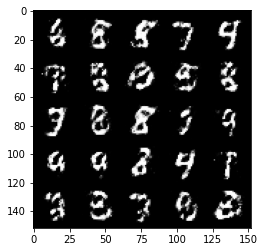

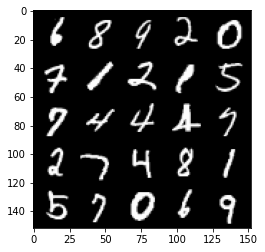

Step 65500: Generator loss: 1.6661390564441676, discriminator loss: 0.38900718706846216


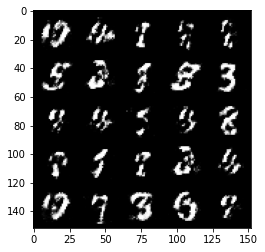

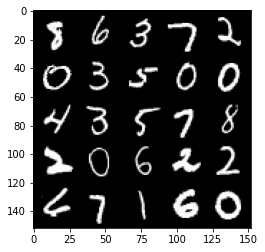

Step 66000: Generator loss: 1.6030663928985602, discriminator loss: 0.4063142083287241


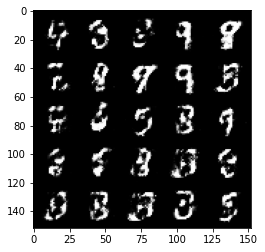

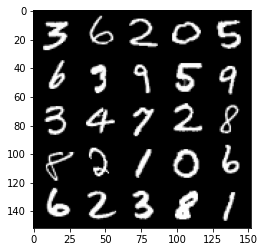

Step 66500: Generator loss: 1.6239365336894998, discriminator loss: 0.40053596830368077


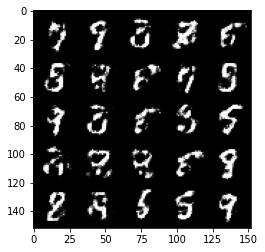

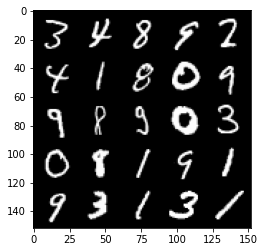

Step 67000: Generator loss: 1.727879002332687, discriminator loss: 0.3689259854555129


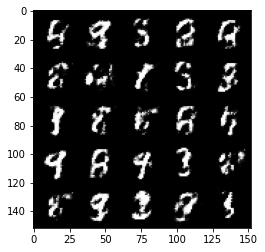

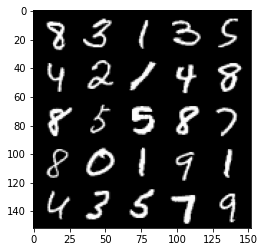

Step 67500: Generator loss: 1.664618871927261, discriminator loss: 0.38420657509565354


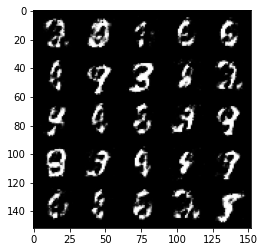

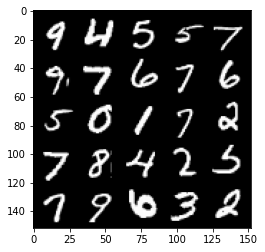

Step 68000: Generator loss: 1.5603167035579681, discriminator loss: 0.4170564660429958


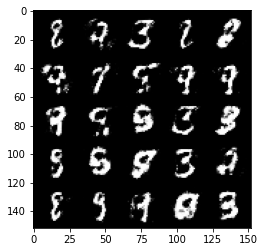

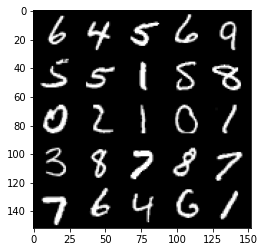

Step 68500: Generator loss: 1.6550586209297191, discriminator loss: 0.3877267305254932


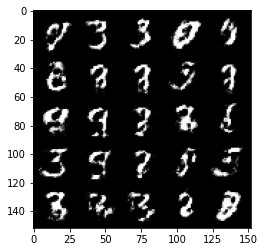

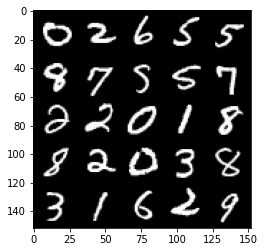

Step 69000: Generator loss: 1.685959964752198, discriminator loss: 0.38483630532026303


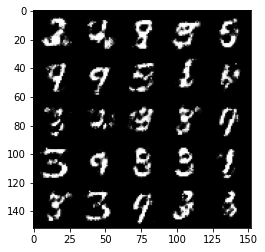

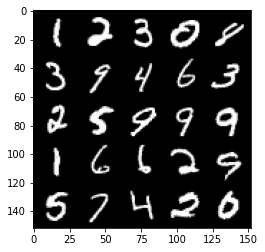

Step 69500: Generator loss: 1.5402440326213847, discriminator loss: 0.4244017145037652


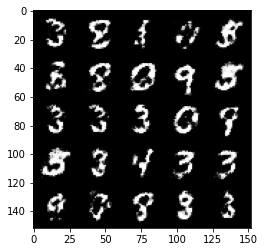

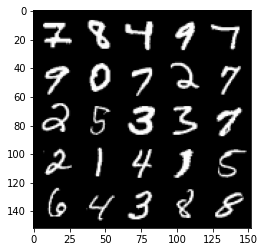

Step 70000: Generator loss: 1.5112408945560458, discriminator loss: 0.41427607011795026


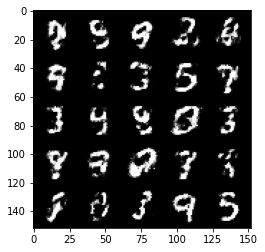

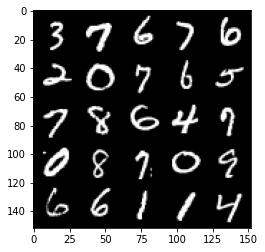

Step 70500: Generator loss: 1.5582660918235767, discriminator loss: 0.41404202961921666


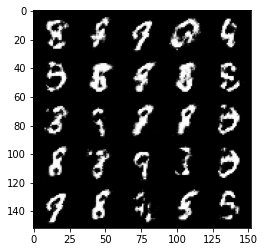

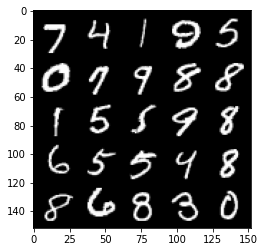

Step 71000: Generator loss: 1.5009639270305628, discriminator loss: 0.43105206197500245


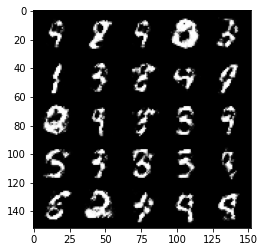

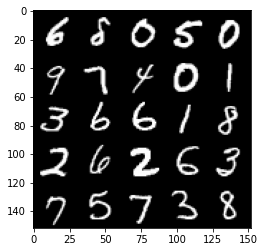

Step 71500: Generator loss: 1.46689587688446, discriminator loss: 0.4469076313972469


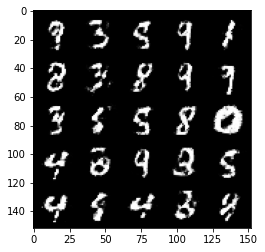

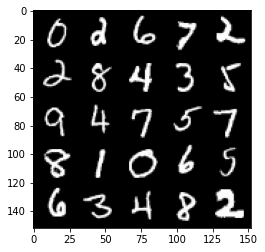

Step 72000: Generator loss: 1.4952567839622495, discriminator loss: 0.42996076917648296


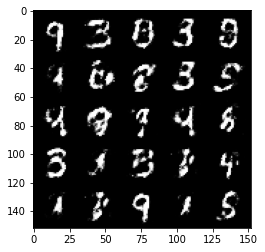

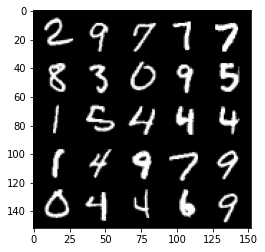

Step 72500: Generator loss: 1.4793206136226655, discriminator loss: 0.43165058147907304


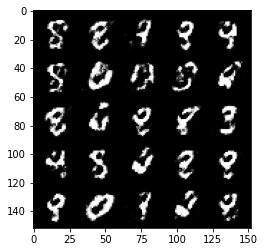

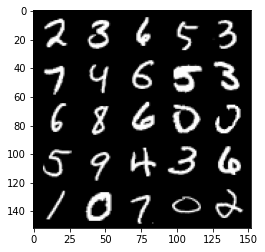

Step 73000: Generator loss: 1.5602451546192162, discriminator loss: 0.4161404611468313


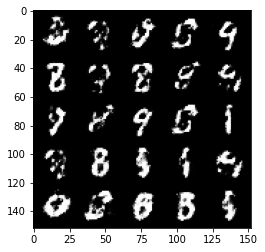

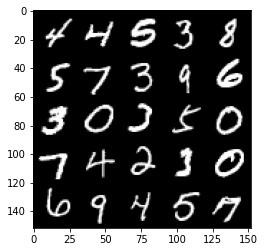

Step 73500: Generator loss: 1.547289497375488, discriminator loss: 0.40670890009403277


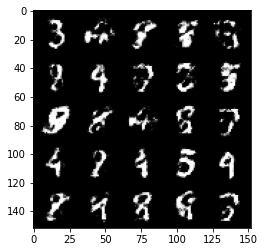

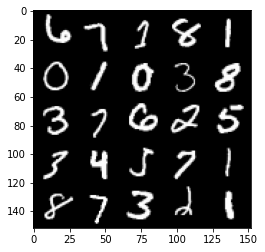

Step 74000: Generator loss: 1.6383581731319423, discriminator loss: 0.38895726215839405


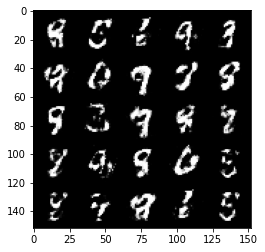

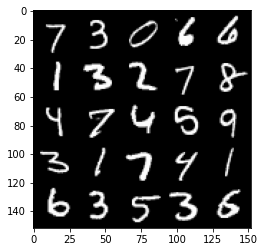

Step 74500: Generator loss: 1.5696701416969299, discriminator loss: 0.4086228904724121


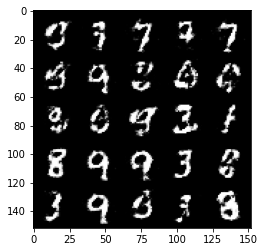

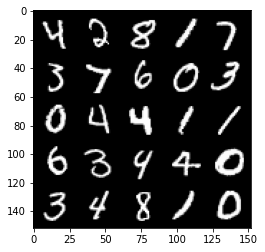

Step 75000: Generator loss: 1.5578524794578559, discriminator loss: 0.40613876897096635


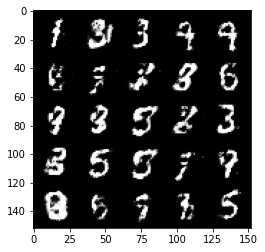

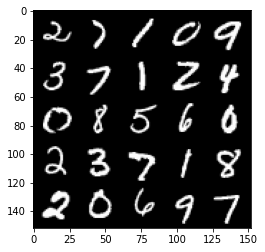

Step 75500: Generator loss: 1.4529357092380533, discriminator loss: 0.4399797071814538


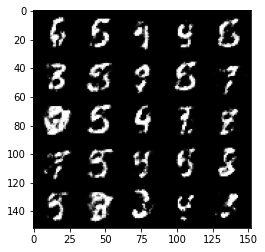

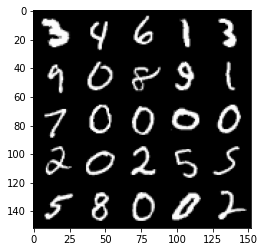

Step 76000: Generator loss: 1.4821455616950978, discriminator loss: 0.42489518988132485


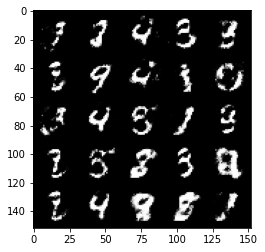

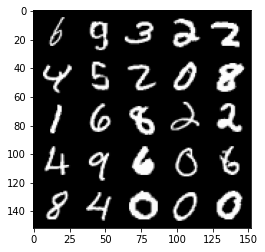

Step 76500: Generator loss: 1.4109031322002423, discriminator loss: 0.4680766854882239


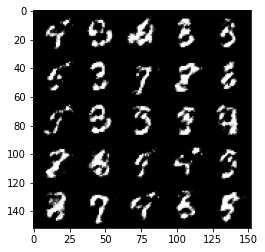

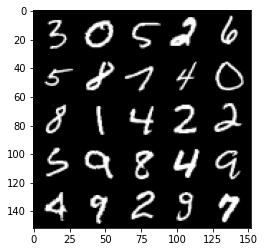

Step 77000: Generator loss: 1.3939841830730437, discriminator loss: 0.4410234640836715


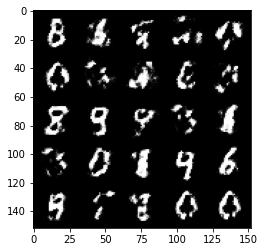

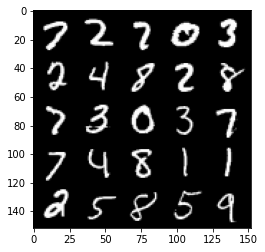

Step 77500: Generator loss: 1.5413470454216007, discriminator loss: 0.41189659595489553


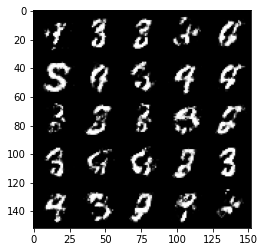

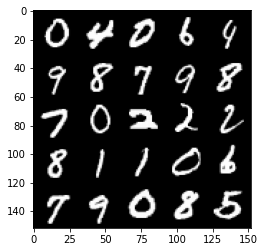

Step 78000: Generator loss: 1.587605427503585, discriminator loss: 0.4026055730581285


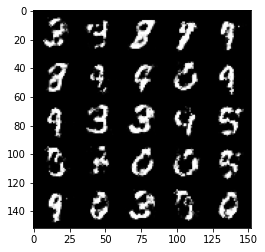

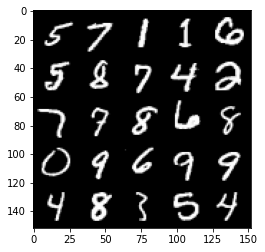

Step 78500: Generator loss: 1.5331908843517301, discriminator loss: 0.4039447013139724


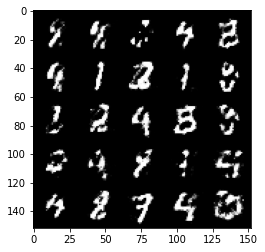

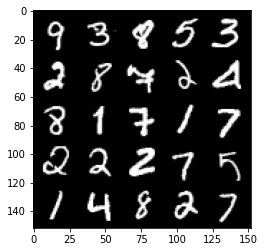

Step 79000: Generator loss: 1.503499949216842, discriminator loss: 0.421027891337871


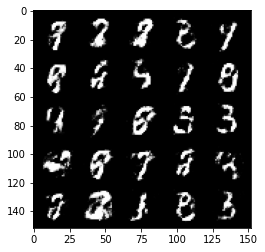

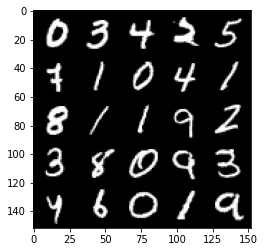

Step 79500: Generator loss: 1.5100265572071079, discriminator loss: 0.4213407685160637


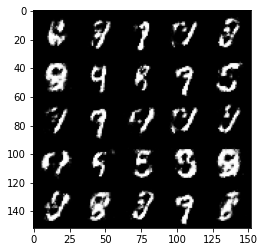

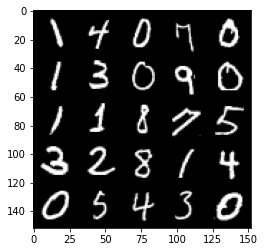

Step 80000: Generator loss: 1.5123522455692286, discriminator loss: 0.41621548837423317


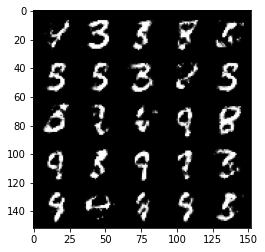

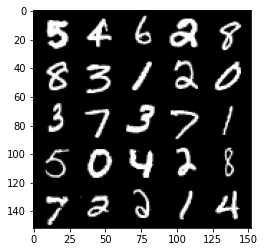

Step 80500: Generator loss: 1.526854352474213, discriminator loss: 0.4140308892130849


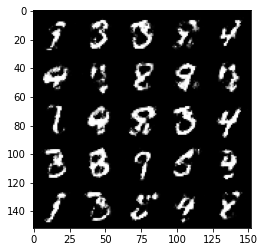

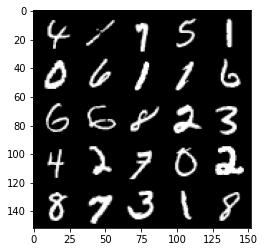

Step 81000: Generator loss: 1.4108235995769487, discriminator loss: 0.46294759356975546


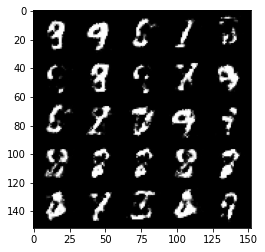

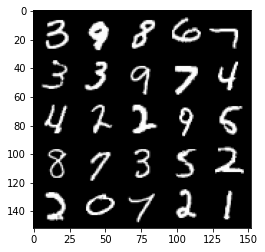

Step 81500: Generator loss: 1.3476926567554486, discriminator loss: 0.45692117780447017


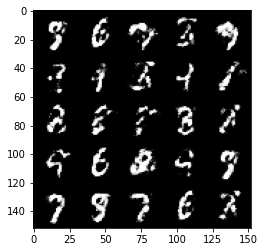

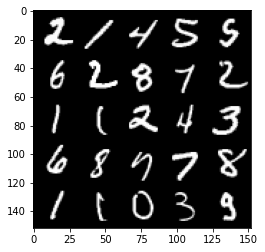

Step 82000: Generator loss: 1.426070336818694, discriminator loss: 0.43752231222391136


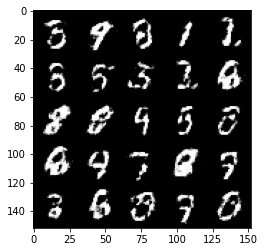

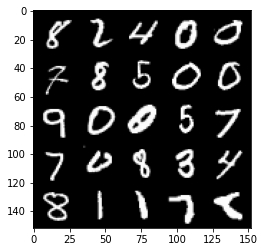

Step 82500: Generator loss: 1.396284241437911, discriminator loss: 0.4459433056712156


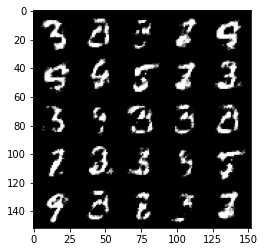

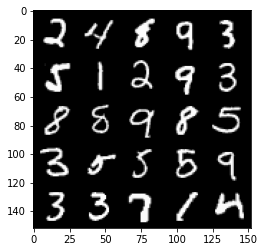

Step 83000: Generator loss: 1.393707514286041, discriminator loss: 0.4387342095375061


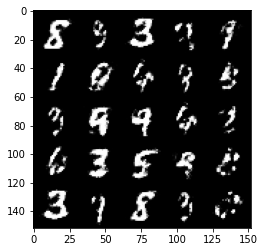

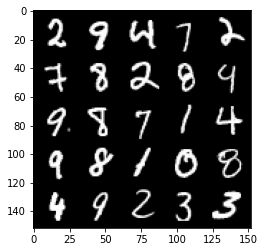

Step 83500: Generator loss: 1.4257824399471282, discriminator loss: 0.43577667081356103


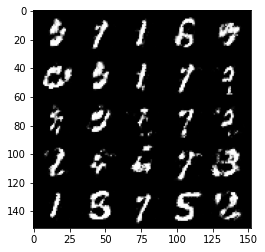

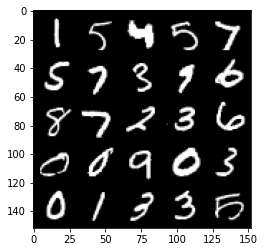

Step 84000: Generator loss: 1.4455453412532808, discriminator loss: 0.43361038726568224


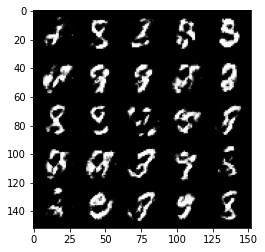

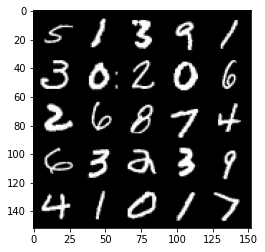

Step 84500: Generator loss: 1.4705260453224178, discriminator loss: 0.4332753642201421


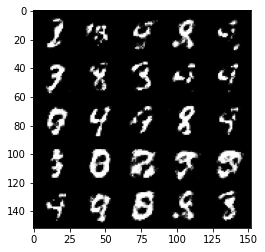

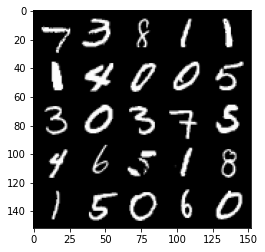

Step 85000: Generator loss: 1.4406168127059948, discriminator loss: 0.4325944070816036


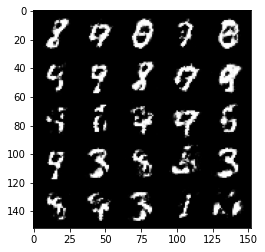

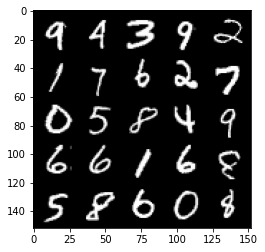

Step 85500: Generator loss: 1.425210795640946, discriminator loss: 0.44086916589736963


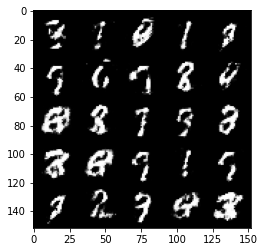

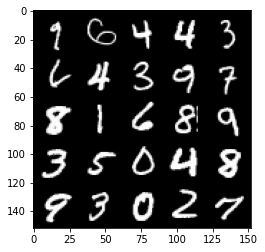

Step 86000: Generator loss: 1.4660994822978959, discriminator loss: 0.431302744030952


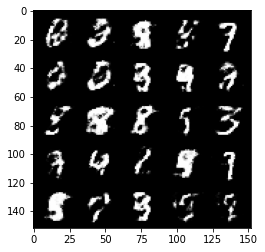

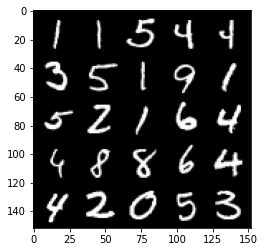

Step 86500: Generator loss: 1.4261056511402121, discriminator loss: 0.4436357927322386


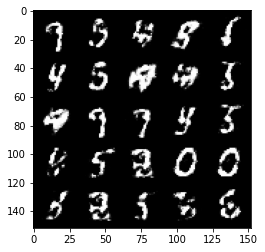

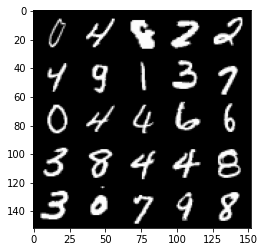

Step 87000: Generator loss: 1.3766362698078176, discriminator loss: 0.4587056922316556


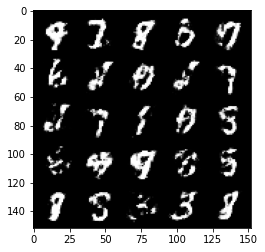

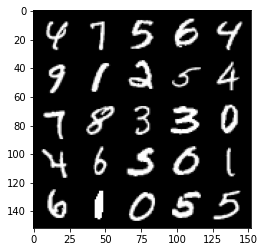

Step 87500: Generator loss: 1.36403186249733, discriminator loss: 0.4641206059455869


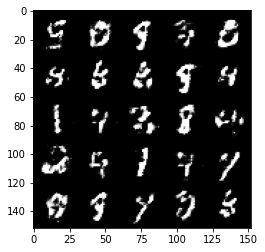

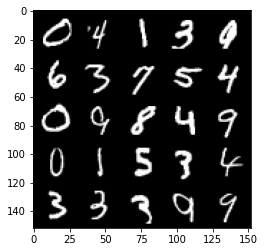

Step 88000: Generator loss: 1.3884391193389893, discriminator loss: 0.4573356584310532


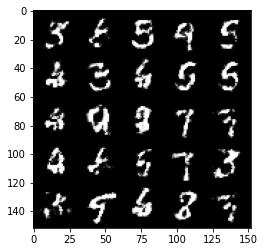

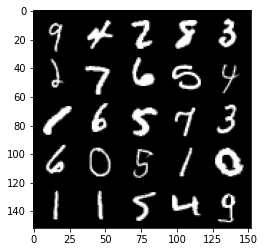

Step 88500: Generator loss: 1.2632134141922005, discriminator loss: 0.49729557752609277


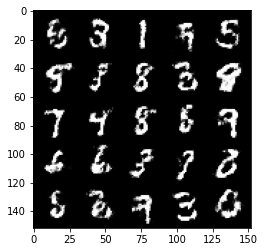

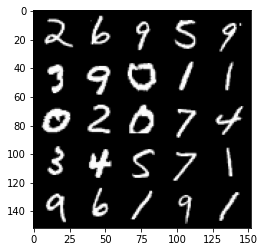

Step 89000: Generator loss: 1.3416323721408843, discriminator loss: 0.4676846350431439


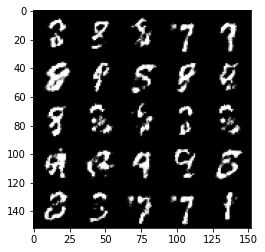

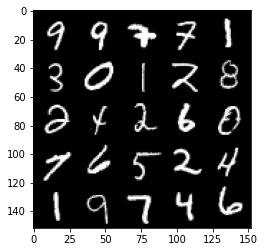

Step 89500: Generator loss: 1.2957740881443025, discriminator loss: 0.48092498165368985


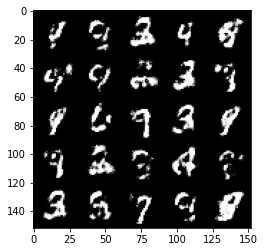

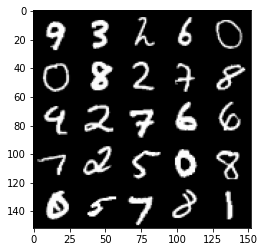

Step 90000: Generator loss: 1.2595847895145418, discriminator loss: 0.49580043601989754


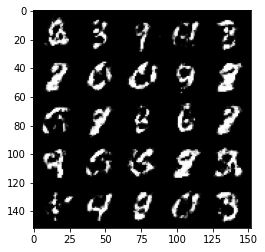

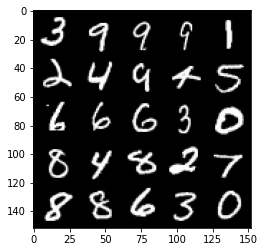

Step 90500: Generator loss: 1.2267816483974465, discriminator loss: 0.4971300874352455


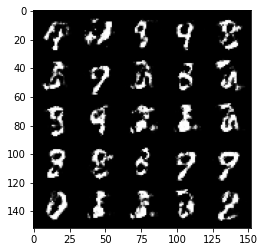

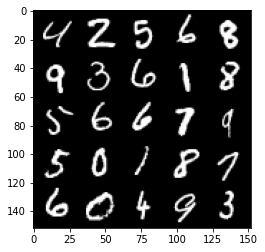

Step 91000: Generator loss: 1.27295066165924, discriminator loss: 0.4783796140551568


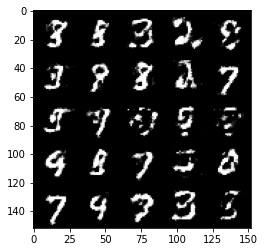

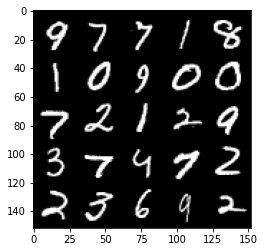

Step 91500: Generator loss: 1.2721058790683735, discriminator loss: 0.47949212688207665


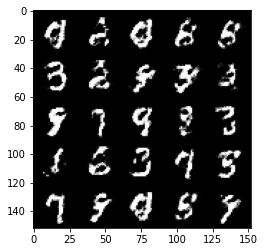

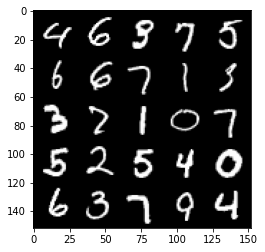

Step 92000: Generator loss: 1.3234189479351033, discriminator loss: 0.4730080944299696


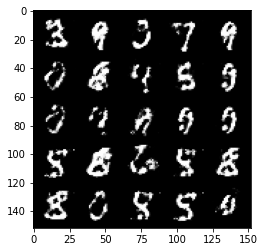

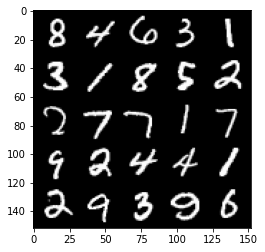

Step 92500: Generator loss: 1.365752808570863, discriminator loss: 0.45439425456523846


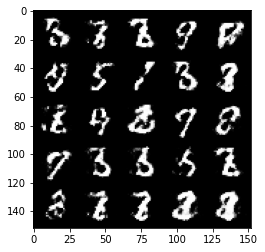

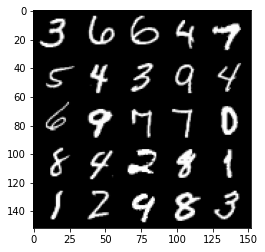

Step 93000: Generator loss: 1.3205457043647777, discriminator loss: 0.4626773555874826


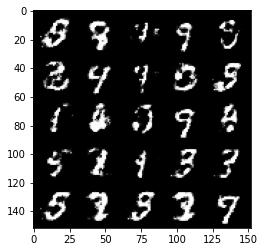

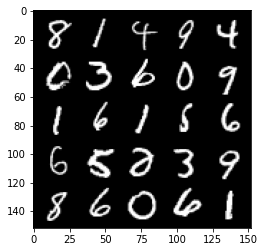

Step 93500: Generator loss: 1.2881718347072613, discriminator loss: 0.47198359823226915


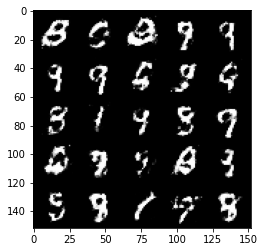

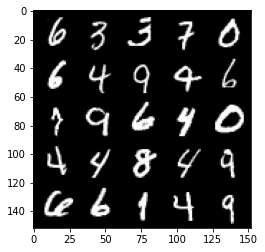

In [30]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
